# DSDA 345 - Asssessing different ML Algorithms

#### 1. Decision Tree
#### 2. Bayes Classifier
#### 3. KNN Classifier
#### 4. Support Vector Machine (SVM)
#### 5. Artificial Neural Network (ANN)
#### 6. Clustering

## Importing libraries

In [63]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt

## Uploading the data

In [64]:
# Higher Education Student Performance Evaluation Dataset
high_edu_stu_performance_eval_df = pd.read_csv('DATA (1).csv', index_col = None)
high_edu_stu_performance_eval_Y = 'GRADE'


# Default of Credit Card Clients
import xlrd
credit_card_df = pd.read_excel('default of credit card clients.xls', index_col = None, header = 1)
credit_card_Y = 'default payment next month'

# Iranian Churn
iranian_churn_df = pd.read_csv('Customer Churn.csv', index_col = None)
iranian_chrn_Y = 'Churn'

# Phishing Websites
from ucimlrepo import fetch_ucirepo 
  
# fetch dataset 
phishing_websites = fetch_ucirepo(id=327) 
  
# data (as pandas dataframes) 
phishing_features = phishing_websites.data.features 
phishing_target = phishing_websites.data.targets 
phishing_Y = 'phishing'

# Choose dataset
data_df = credit_card_df

## Extract Target and Feature Attributes

In [65]:
target_atr = credit_card_Y

if target_atr == phishing_Y:
    Y = phishing_target
    X = phishing_features
else:
    Y = data_df[target_atr]
    X = data_df.drop(target_atr , axis = 1)
    
    if target_atr == high_edu_stu_performance_eval_Y:
        X = X = X.drop('STUDENT ID', axis = 1)

    if target_atr == credit_card_Y:
        X = X = X.drop('ID', axis = 1)


## Exploratory Data Analysis (EDA)

In [66]:
data_df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0


In [67]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype
---  ------                      --------------  -----
 0   ID                          30000 non-null  int64
 1   LIMIT_BAL                   30000 non-null  int64
 2   SEX                         30000 non-null  int64
 3   EDUCATION                   30000 non-null  int64
 4   MARRIAGE                    30000 non-null  int64
 5   AGE                         30000 non-null  int64
 6   PAY_0                       30000 non-null  int64
 7   PAY_2                       30000 non-null  int64
 8   PAY_3                       30000 non-null  int64
 9   PAY_4                       30000 non-null  int64
 10  PAY_5                       30000 non-null  int64
 11  PAY_6                       30000 non-null  int64
 12  BILL_AMT1                   30000 non-null  int64
 13  BILL_AMT2                   30000 non-null  int64
 14  BILL_A

In [68]:
data_df.columns

Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0',
       'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'default payment next month'],
      dtype='object')

### Plotting

Text(0, 0.5, 'Number of records')

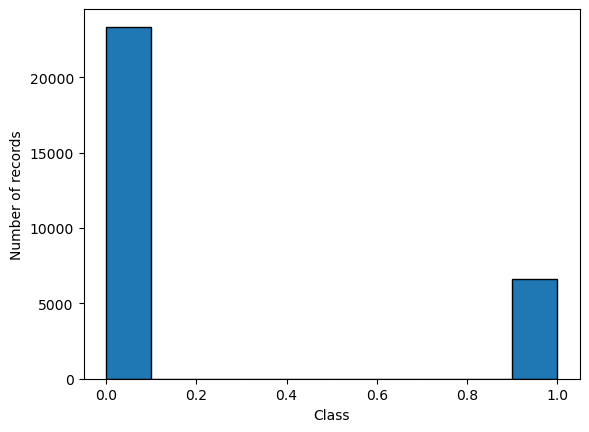

In [69]:
plt.hist(Y, edgecolor = "black")
plt.xlabel("Class")
plt.ylabel("Number of records")

## Splitting the data

In [70]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, 
                                                    Y, 
                                                    test_size= 0.3, 
                                                    stratify = Y, 
                                                    random_state = 42, 
                                                    shuffle = True)

#Reset index
X_train = X_train.reset_index()
X_train = X_train.drop('index', axis = 1)
Y_train = Y_train.reset_index()
Y_train = Y_train.drop('index', axis = 1)
X_test = X_test.reset_index()
X_test = X_test.drop('index', axis = 1)
Y_test = Y_test.reset_index()
Y_test = Y_test.drop('index', axis = 1)

In [71]:
X_train.shape

(21000, 23)

In [72]:
X_test.shape

(9000, 23)

In [73]:
X_train.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,160000,2,2,2,32,0,0,0,0,0,...,155404,153234,156731,155818,6000,6000,5600,6000,6000,5500
1,100000,2,1,2,30,0,0,0,0,2,...,42283,51539,50583,52588,5000,10000,10000,0,2846,1936
2,80000,1,1,2,29,0,0,0,0,0,...,64277,45455,42231,42804,3300,2500,1556,1600,1600,1600
3,20000,2,2,1,27,0,0,-1,-1,-2,...,780,0,0,0,1006,780,0,0,0,0
4,50000,2,1,2,30,-2,-2,-2,-2,-2,...,0,0,0,0,2070,0,0,0,0,0


In [74]:
Y_train.head()

,default payment next month
0,0
1,1
2,0
3,0
4,0


## Training the Model

### 1. Decision Tree

In [75]:
from sklearn import tree
# Classifier
clf = tree.DecisionTreeClassifier(criterion='gini')

# Training
clf.fit(X_train, Y_train)

# Prediction
Y_predictions_1 = clf.predict(X_test)

### Obtaining accuracy of the model

In [76]:
from sklearn.metrics import confusion_matrix, classification_report
def accuracy(confusion_matrix):
   diagonal_sum = confusion_matrix.trace()
   sum_of_all_elements = confusion_matrix.sum()
   return diagonal_sum / sum_of_all_elements

In [77]:
# Confusion Matrix
cm_1 = confusion_matrix(Y_predictions_1, Y_test)

# Classification Report
report_1 = classification_report(Y_test, Y_predictions_1)

# Accuracy

In [78]:
print(cm_1)

[[5672 1202]
 [1337  789]]


In [79]:
print(report_1)

              precision    recall  f1-score   support

           0       0.83      0.81      0.82      7009
           1       0.37      0.40      0.38      1991

    accuracy                           0.72      9000
   macro avg       0.60      0.60      0.60      9000
weighted avg       0.72      0.72      0.72      9000



In [80]:
print('Overall Accuracy is: ', accuracy(cm_1) * 100)

Overall Accuracy is:  71.78888888888889


In [81]:
print('Testing is: ', (1-accuracy(cm_1)) * 100 )

Testing is:  28.21111111111111


### Tree Visualization

In [82]:
plt.figure(figsize=(100, 100))
tree.plot_tree(clf, 
               filled=True, 
               fontsize=10, 
               max_depth= None,
               feature_names = list(X.columns), 
               class_names = list(str(Y.unique())))
plt.show()

### Varying Number of Nodes

In [83]:
# Define a range of maximum number of nodes to try
max_nodes_range = range(2, 300)  # Adjust this range as needed

# Initialize lists to store training and testing errors
training_errors_node = []
testing_errors_node = []

# Iterate over different maximum number of depths
for max_nodes in max_nodes_range:
    # Create decision tree classifier with specified maximum number of depths
    clf_node = tree.DecisionTreeClassifier(criterion='gini', max_leaf_nodes=max_nodes)

    # Train the classifier
    clf_node.fit(X_train, Y_train)

    # Predict labels for training and testing sets
    Y_train_pred_node = clf_node.predict(X_train)
    Y_test_pred_node = clf_node.predict(X_test)

    #Calculate confusion matrix
    cm_train_node = confusion_matrix(Y_train_pred_node, Y_train)
    cm_test_node = confusion_matrix(Y_test_pred_node, Y_test)

    # Calculate training and testing errors
    training_error_node = (1 - accuracy(cm_train_node)) * 100
    testing_error_node = (1 - accuracy(cm_test_node )) * 100

    # Append errors to the lists
    training_errors_node.append(training_error_node)
    testing_errors_node.append(testing_error_node)
print('Finished')

Finished


### Plotting the results

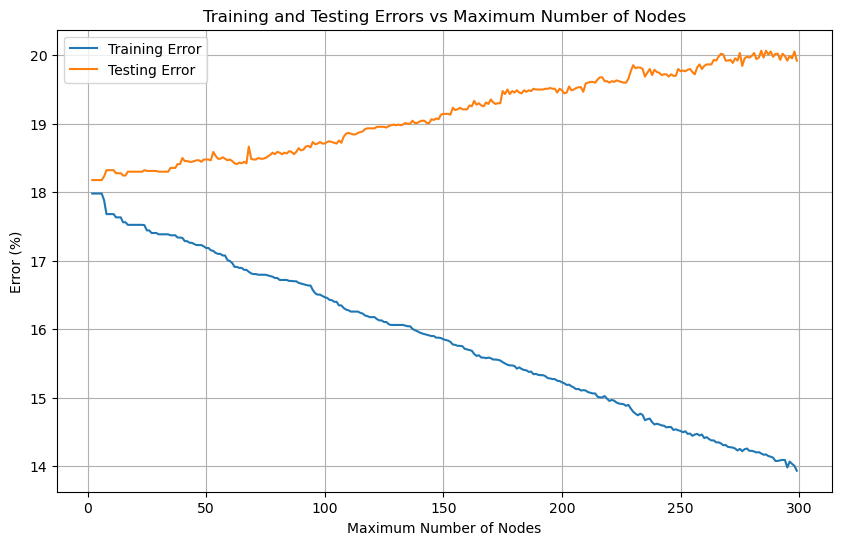

In [84]:
# Plot the training and testing errors against the number of nodes
plt.figure(figsize=(10, 6))
plt.plot(max_nodes_range, training_errors_node, label='Training Error')
plt.plot(max_nodes_range, testing_errors_node, label='Testing Error')
plt.xlabel('Maximum Number of Nodes')
plt.ylabel('Error (%)')
plt.title('Training and Testing Errors vs Maximum Number of Nodes')
plt.legend()
plt.grid(True)
plt.show()

### 4. Support Vector Machine (SVM)

In [85]:
from sklearn.svm import SVC
from sklearn import preprocessing as sk_preprocessing
from sklearn.model_selection import train_test_split

# Z-Score normalization
scaler = sk_preprocessing.StandardScaler()
scaler.fit(X_train)
X_train_normalized = scaler.transform(X_train)
X_test_normalized = scaler.transform(X_test)

### Linear SVM Model

In [127]:
# Create a linear SVM classifier
linear_svm = SVC(kernel='linear', probability = True, random_state = 42)

# Train the classifier
linear_svm.fit(X_train_normalized, Y_train.values.ravel())

# Make predictions on the test set
y_pred_linear = linear_svm.predict(X_test_normalized)

### Obtaining accuracy of model

In [128]:
# Confusion Matrix
cm_4_linear = confusion_matrix(y_pred_linear, Y_test)

# Classification Report
report_4_linear = classification_report(Y_test, y_pred_linear)

# Accuracy

In [129]:
print(cm_4_linear)

[[6797 1515]
 [ 212  476]]


In [130]:
print(report_4_linear)

              precision    recall  f1-score   support

           0       0.82      0.97      0.89      7009
           1       0.69      0.24      0.36      1991

    accuracy                           0.81      9000
   macro avg       0.75      0.60      0.62      9000
weighted avg       0.79      0.81      0.77      9000



In [131]:
print('Overall Accuracy is: ', accuracy(cm_4_linear) * 100)

Overall Accuracy is:  80.81111111111112


In [132]:
print('Testing is: ', (1-accuracy(cm_4_linear)) * 100 )

Testing is:  19.18888888888889


### Non-linear SVM Model - Radial Basis Function

In [133]:
# Create a non-linear SVM classifier with Radial Basis Function (RBF) kernel
nonlinear_svm = SVC(kernel='rbf', probability = True, random_state = 42)

# Train the classifier
nonlinear_svm.fit(X_train_normalized, Y_train.values.ravel())

# Make predictions on the test set
y_pred_non_linear = nonlinear_svm.predict(X_test_normalized)

### Obtaining accuracy of model

In [134]:
# Confusion Matrix
cm_4_non_linear = confusion_matrix(y_pred_non_linear, Y_test)

# Classification Report
report_4_non_linear = classification_report(Y_test, y_pred_non_linear)

# Accuracy

In [135]:
print(cm_4_non_linear)

[[6676 1341]
 [ 333  650]]


In [136]:
print(report_4_non_linear)

              precision    recall  f1-score   support

           0       0.83      0.95      0.89      7009
           1       0.66      0.33      0.44      1991

    accuracy                           0.81      9000
   macro avg       0.75      0.64      0.66      9000
weighted avg       0.79      0.81      0.79      9000



In [137]:
print('Overall Accuracy is: ', accuracy(cm_4_non_linear) * 100)

Overall Accuracy is:  81.39999999999999


In [138]:
print('Testing Error is: ', (1-accuracy(cm_4_non_linear)) * 100 )

Testing Error is:  18.600000000000005


### Sigmoid Kernel

In [139]:
# Create a non-linear SVM classifier with Sigmoid kernel
sigmoid_svm = SVC(kernel='sigmoid', probability = True, random_state = 42)

# Train the classifier
sigmoid_svm.fit(X_train_normalized, Y_train.values.ravel())

# Make predictions on the test set
y_pred_sigmoid = sigmoid_svm.predict(X_test_normalized)

### Obtaining accuracy of model

In [140]:
# Confusion Matrix
cm_4_sigmoid = confusion_matrix(y_pred_sigmoid, Y_test)

# Classification Report
report_4_sigmoid = classification_report(Y_test, y_pred_sigmoid)

# Accuracy

In [141]:
print(cm_4_sigmoid)

[[5744 1406]
 [1265  585]]


In [142]:
print(report_4_sigmoid)

              precision    recall  f1-score   support

           0       0.80      0.82      0.81      7009
           1       0.32      0.29      0.30      1991

    accuracy                           0.70      9000
   macro avg       0.56      0.56      0.56      9000
weighted avg       0.70      0.70      0.70      9000



In [143]:
print('Overall Accuracy is: ', accuracy(cm_4_sigmoid) * 100)

Overall Accuracy is:  70.32222222222222


In [144]:
print('Testing Error is: ', (1-accuracy(cm_4_sigmoid)) * 100 )

Testing Error is:  29.67777777777778


### Polynomial Kernel

In [145]:
# Create a non-linear SVM classifier with Polynomial degree 4 kernel. Same result for degree 6
poly_svm = SVC(kernel='poly', degree = 4, probability = True, random_state = 42)

# Train the classifier
poly_svm.fit(X_train_normalized, Y_train.values.ravel())

# Make predictions on the test set
y_pred_poly = poly_svm.predict(X_test_normalized)

### Obtaining accuracy of model

In [146]:
# Confusion Matrix
cm_4_poly = confusion_matrix(y_pred_poly, Y_test)

# Classification Report
report_4_poly = classification_report(Y_test, y_pred_poly)

# Accuracy

In [147]:
print(cm_4_poly)

[[6764 1585]
 [ 245  406]]


In [148]:
print(report_4_poly)

              precision    recall  f1-score   support

           0       0.81      0.97      0.88      7009
           1       0.62      0.20      0.31      1991

    accuracy                           0.80      9000
   macro avg       0.72      0.58      0.59      9000
weighted avg       0.77      0.80      0.75      9000



In [149]:
print('Overall Accuracy is: ', accuracy(cm_4_poly) * 100)

Overall Accuracy is:  79.66666666666666


In [150]:
print('Testing Error is: ', (1-accuracy(cm_4_poly)) * 100 )

Testing Error is:  20.333333333333336


### 5. Artificial Neural Network

In [110]:
from sklearn.neural_network import MLPClassifier
import sys
sys.setrecursionlimit(100000)

# Creating the neural network
neural_net = MLPClassifier(activation = 'logistic', hidden_layer_sizes = 200)
# Less than 1000 layers for sure or even 200 is enough now with normalized
# Y_train_layer = Y_train.values.ravel()
Y_train_layer = Y_train
# Training
neural_net.fit(X_train_normalized, Y_train_layer.values.ravel())

# Predicitions
Y_predictions_5 = neural_net.predict(X_test_normalized)
Y_predictions_5_train = neural_net.predict(X_train_normalized)

C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


### Obtaining Accuracy of the Model

In [111]:
# Confusion Matrix
cm_5 = confusion_matrix(Y_predictions_5, Y_test)
cm_5_train = confusion_matrix(Y_predictions_5_train, Y_train_layer)

#Classification Report
report_5 = classification_report(Y_test, Y_predictions_5)

In [112]:
print(cm_5)

[[6613 1264]
 [ 396  727]]


In [113]:
print(cm_5_train)

[[15550  2795]
 [  805  1850]]


In [114]:
print(report_5)

              precision    recall  f1-score   support

           0       0.84      0.94      0.89      7009
           1       0.65      0.37      0.47      1991

    accuracy                           0.82      9000
   macro avg       0.74      0.65      0.68      9000
weighted avg       0.80      0.82      0.80      9000



In [115]:
print("Testing accuracy is: ", accuracy(cm_5) * 100, "%")

Testing accuracy is:  81.55555555555556 %


In [116]:
print("Training accuracy is: ",accuracy(cm_5_train) * 100, "%")

Training accuracy is:  82.85714285714286 %


In [117]:
test_error = (1 - accuracy(cm_5)) * 100
print("Testing Error is: ", test_error, "%")

Testing Error is:  18.444444444444443 %


In [118]:
train_error = (1 - accuracy(cm_5_train)) * 100
print("Training Error is: ", train_error, "%")

Training Error is:  17.14285714285714 %


### Varying Hidden Layers

In [119]:
# Define a range of maximum number of hidden layers to try
hidden_layers_range = range(1, 200)  # Adjust this range as needed

# Initialize lists to store training and testing errors
training_errors_layer = []
testing_errors_layer = []

# Iterate over different maximum number of hidden layers
for hidden_layer in hidden_layers_range:
    # Create ANN classifier with specified maximum number of hidden layers
    clf_layer = MLPClassifier(activation = 'logistic', hidden_layer_sizes=hidden_layer)

    # Train the classifier
    clf_layer.fit(X_train_normalized, Y_train_layer)

    # Predict labels for training and testing sets
    Y_train_pred_layer = clf_layer.predict(X_train_normalized)
    Y_test_pred_layer = clf_layer.predict(X_test_normalized)

    #Calculate confusion matrix
    cm_train_layer = confusion_matrix(Y_train_pred_layer, Y_train_layer)
    cm_test_layer = confusion_matrix(Y_test_pred_layer, Y_test)

    # Calculate training and testing errors
    training_error_layer = (1 - accuracy(cm_train_layer)) * 100
    testing_error_layer = (1 - accuracy(cm_test_layer )) * 100

    # Append errors to the lists
    training_errors_layer.append(training_error_layer)
    testing_errors_layer.append(testing_error_layer)
print('Finished')

C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1102: DataConversionWarning: A colu

C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exampl

C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exampl

C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exampl

C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exampl

C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exampl

C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exampl

C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exampl

C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exampl

C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exampl

C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exampl

C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\20020253\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exampl

Finished


### Plotting the results

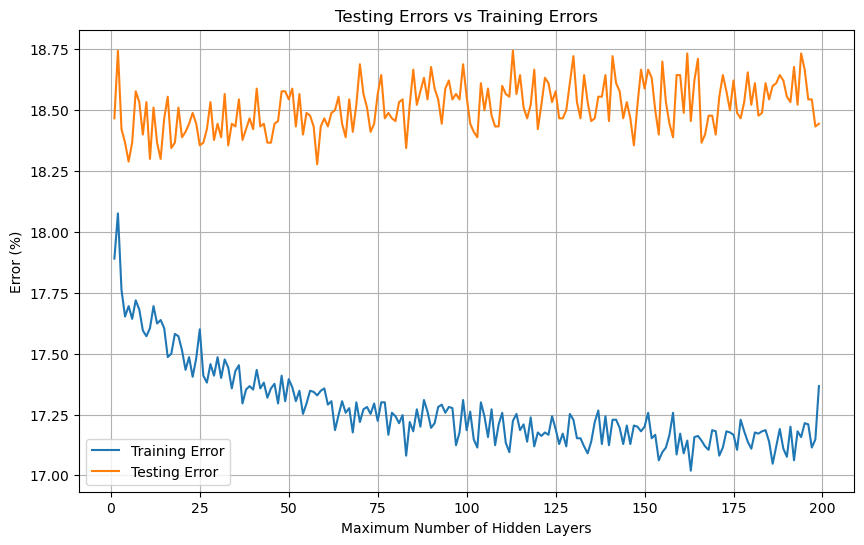

In [120]:
# Plot the training and testing errors against the number of nodes
plt.figure(figsize=(10, 6))
plt.plot(hidden_layers_range, training_errors_layer, label='Training Error')
plt.plot(hidden_layers_range, testing_errors_layer, label='Testing Error')
plt.xlabel('Maximum Number of Hidden Layers')
plt.ylabel('Error (%)')
plt.title('Testing Errors vs Training Errors')
plt.legend()
plt.grid(True)
plt.show()

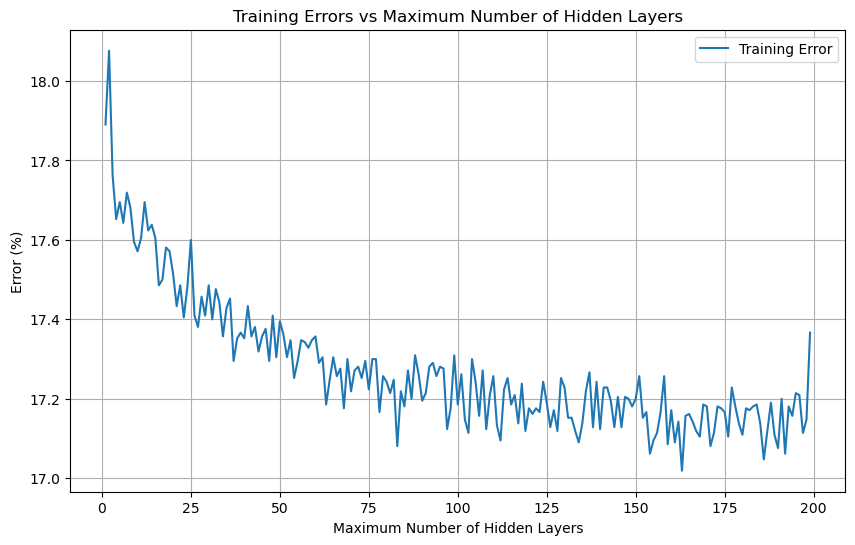

In [121]:
# Plot the training and testing errors against the number of nodes
plt.figure(figsize=(10, 6))
plt.plot(hidden_layers_range, training_errors_layer, label='Training Error')
plt.xlabel('Maximum Number of Hidden Layers')
plt.ylabel('Error (%)')
plt.title('Training Errors vs Maximum Number of Hidden Layers')
plt.legend()
plt.grid(True)
plt.show()

### ROC Curve

In [151]:
from sklearn.metrics import roc_curve, auc

In [152]:
# Predict probabilities for test set
y_probs_dt = clf.predict_proba(X_test)[:, 1]
y_probs_svm_linear = linear_svm.predict_proba(X_test_normalized)[:, 1]
y_probs_svm_rbf = nonlinear_svm.predict_proba(X_test_normalized)[:, 1]
y_probs_svm_sigmoid = sigmoid_svm.predict_proba(X_test_normalized)[:, 1]
y_probs_svm_poly = poly_svm.predict_proba(X_test_normalized)[:, 1]
y_probs_neural_net = neural_net.predict(X_test_normalized).ravel()

# Compute ROC curve and ROC area for each model
fpr_dt, tpr_dt, _ = roc_curve(Y_test, y_probs_dt)
roc_auc_dt = auc(fpr_dt, tpr_dt)

fpr_svm_linear, tpr_svm_linear, _ = roc_curve(Y_test, y_probs_svm_linear)
roc_auc_svm_linear = auc(fpr_svm_linear, tpr_svm_linear)

fpr_svm_rbf, tpr_svm_rbf, _ = roc_curve(Y_test, y_probs_svm_rbf)
roc_auc_svm_rbf = auc(fpr_svm_rbf, tpr_svm_rbf)

fpr_svm_sigmoid, tpr_svm_sigmoid, _ = roc_curve(Y_test, y_probs_svm_sigmoid)
roc_auc_svm_sigmoid = auc(fpr_svm_sigmoid, tpr_svm_sigmoid)

fpr_svm_poly, tpr_svm_poly, _ = roc_curve(Y_test, y_probs_svm_poly)
roc_auc_svm_poly = auc(fpr_svm_poly, tpr_svm_poly)

fpr_neural_net, tpr_neural_net, _ = roc_curve(Y_test, y_probs_neural_net)
roc_auc_neural_net = auc(fpr_neural_net, tpr_neural_net)

### Plotting the results

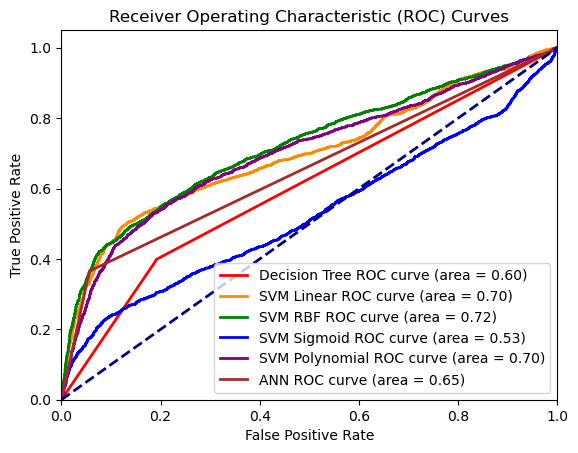

In [153]:
# Plot ROC curves for both models
plt.figure()
lw = 2
plt.plot(fpr_dt, tpr_dt, color='red', lw=lw, label='Decision Tree ROC curve (area = %0.2f)' % roc_auc_dt)
plt.plot(fpr_svm_linear, tpr_svm_linear, color='darkorange', lw=lw, label='SVM Linear ROC curve (area = %0.2f)' % roc_auc_svm_linear)
plt.plot(fpr_svm_rbf, tpr_svm_rbf, color='green', lw=lw, label='SVM RBF ROC curve (area = %0.2f)' % roc_auc_svm_rbf)
plt.plot(fpr_svm_sigmoid, tpr_svm_sigmoid, color='blue', lw=lw, label='SVM Sigmoid ROC curve (area = %0.2f)' % roc_auc_svm_sigmoid)
plt.plot(fpr_svm_poly, tpr_svm_poly, color='purple', lw=lw, label='SVM Polynomial ROC curve (area = %0.2f)' % roc_auc_svm_poly)
plt.plot(fpr_neural_net, tpr_neural_net, color='brown', lw=lw, label='ANN ROC curve (area = %0.2f)' % roc_auc_neural_net)

plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')
plt.legend(loc="lower right")
plt.show()

In [154]:
### ROC curve and denodrogram (Hierarchical Clustering)
### K-fold cross validation, MSE or any other types of Loss ???
### Ethical Issues
